# TITANIC

# Description

The sinking of the RMS Titanic is one of the most infamous shipwrecks in history. On April 15, 1912, during her maiden voyage, the Titanic sank after colliding with an iceberg, killing 1502 out of 2224 passengers and crew. This sensational tragedy shocked the international community and led to better safety regulations for ships.
One of the reasons that the shipwreck led to such loss of life was that there were not enough lifeboats for the passengers and crew. Although there was some element of luck involved in surviving the sinking, some groups of people were more likely to survive than others, such as women, children, and the upper-class.
In this challenge, we ask you to complete the analysis of what sorts of people were likely to survive. In particular, we ask you to apply the tools of machine learning to predict which passengers survived the tragedy.

pclass: A proxy for socio-economic status (SES)<br>
1st = Upper<br>
2nd = Middle<br>
3rd = Lower<br>

age: Age is fractional if less than 1. If the age is estimated, is it in the form of xx.5<br>

sibsp: The dataset defines family relations in this way...<br>
Sibling = brother, sister, stepbrother, stepsister<br>
Spouse = husband, wife (mistresses and fiancés were ignored)<br>

parch: The dataset defines family relations in this way...<br>
Parent = mother, father<br>
Child = daughter, son, stepdaughter, stepson<br>
Some children travelled only with a nanny, therefore parch=0 for them.<br>

## Import

In [ ]:
#!pip install bamboolib

In [ ]:
#!pip install plotly==5.4.0
#!pip install seaborn==0.11.0

In [1]:
#pip install pycaret

Note: you may need to restart the kernel to use updated packages.


In [122]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling as pdf
import seaborn as sns
import datetime
import plotly.express as px
import bamboolib as bam

%matplotlib inline
#sns.set_theme()

## Seaborn setting 

In [123]:
PALETTE = sns.color_palette("Set1")

In [124]:
sns.set_context("paper", rc={"font.size":20, 
                             "figure.titlesize":20, 
                             "axes.titlesize":15, 
                             "axes.labelsize":13, 
                             "xtick.labelsize": 13,
                             "ytick.labelsize": 13,
                             "legend.fontsize": 10,
                             "legend.title_fontsize": 15}) 

In [133]:
df=pd.read_csv('train.csv',index_col='PassengerId')

### First data information 

In [134]:
display(df.shape,df.head(100), df.info(), df.describe())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 891 entries, 1 to 891
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Name      891 non-null    object 
 3   Sex       891 non-null    object 
 4   Age       714 non-null    float64
 5   SibSp     891 non-null    int64  
 6   Parch     891 non-null    int64  
 7   Ticket    891 non-null    object 
 8   Fare      891 non-null    float64
 9   Cabin     204 non-null    object 
 10  Embarked  889 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 83.5+ KB


(891, 11)

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
PassengerId,,,,,,,,,,,
1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
96,0,3,"Shorney, Mr. Charles Joseph",male,NaN,0,0,374910,8.0500,NaN,S
97,0,1,"Goldschmidt, Mr. George B",male,71.0,0,0,PC 17754,34.6542,A5,C
98,1,1,"Greenfield, Mr. William Bertram",male,23.0,0,1,PC 17759,63.3583,D10 D12,C


None

,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


#### Pandas Profiling on Titanic

In [54]:
titanic_profile1=pdf.ProfileReport(df)
titanic_profile1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

###  Data cleanning 

#### Change type of variable

In [135]:
SurvivedToReplace = [1,0]
SurvivedValues = ["Yes","No"]
df['Survived'] = df['Survived'].replace(to_replace=SurvivedToReplace, value=SurvivedValues)

In [136]:
PclassToReplace = ["1", "2", "3"]
PclassValues = [ "Upper","Middle","Lower"]
df['Pclass'] = df['Pclass'].replace(to_replace=PclassToReplace, value=PclassValues)

In [137]:
df['SibSp'] = df['SibSp'].astype('float64')
df['Parch'] = df['Parch'].astype('float64')
df['Pclass'] = df['Pclass'].astype('object')

#### Remplace NaN value

Il y a 177 valeurs manquantes au niveau de l'age, ce qui represente 19,9% des données. On va les remplacer la mediane.

In [138]:
df['Age'].isna().sum()

177

In [139]:
df['Age'].fillna(df['Age'].median(), inplace=True)

In [140]:
df['Cabin'].isna().sum()

687

La variables Cabin contient 687 NaN ce qui represente 77% des données.<br>
Pour resoudre ce probleme nous avons deux solutions:<br>
    
    La premiére etant de supprimer les NaN 
    La seconde consiste à les remplacer par une imputation avec l'algo des Knn
    La troisieme serait de les remplacer par "Pas de cabin"
    
Nous choisirons d'utiliser la troisiéme méthode.

In [141]:
df['Cabin'].fillna("Pas de cabin", inplace=True)

#### Drop variable

On decide de supprimer les cols suivantes: Ticket et Name parce qu'elles contiennent plusieurs NaN.

In [142]:
df.drop(columns="Ticket", inplace=True)
df.drop(columns="Name", inplace=True)

#### Drop indiv

Il y a deux valeur manquantes pour la variable Embarked, nous allons les supprimer.

In [143]:
mask = df['Embarked'].isna()
df.drop(index=df['Embarked'][mask].index, inplace=True)

In [144]:
df['Embarked'].isna().sum()

0

#### Second Pandas Profiling on Titanic

In [97]:
titanic_profile2=pdf.ProfileReport(df)
titanic_profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Distribution 

In [145]:
df.to_csv('Df.csv')

##### Age

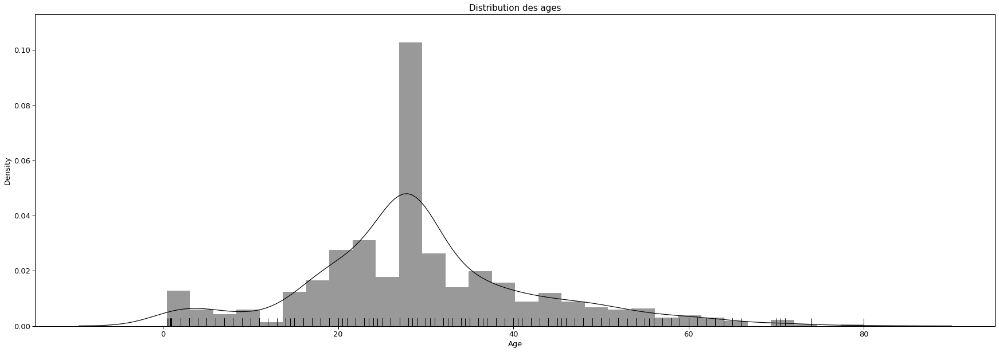

In [148]:
plt.figure(figsize=(30,10))
plt.title("Distribution des ages")
ax = sns.distplot(df['Age'],rug=True,kde=True,color='black')
plt.show()

In [149]:
fig = px.histogram(df, x='Age', color='Survived', template='xgridoff')
fig

#### Les variables cat

###### Survived

In [150]:
valeur1=dict(df['Survived'].value_counts())
valeur1

{'No': 549, 'Yes': 340}

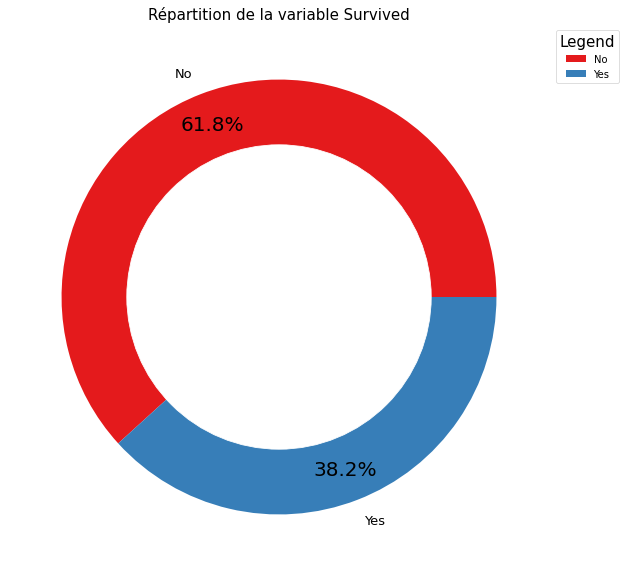

In [151]:
plt.figure(figsize=(30,10))
plt.title("Répartition de la variable Survived")
plt.pie(valeur1.values(),labels=valeur1.keys(),colors=PALETTE,autopct='%1.1f%%',shadow=False,pctdistance=0.85)
plt.legend(title='Legend',labels=valeur1.keys(),bbox_to_anchor=(1,1))

# add a circle at the center to transform it in a donut chart
circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(circle)


plt.show()

In [152]:
fig = px.bar(df, x='Survived', color='Sex', template='xgridoff')
fig

In [120]:
valeur=dict(df['Sex'].value_counts())
valeur

{'male': 577, 'female': 312}

###### Pclass

In [156]:
valeur2=dict(df['Pclass'].value_counts())
valeur2

{3: 491, 1: 214, 2: 184}

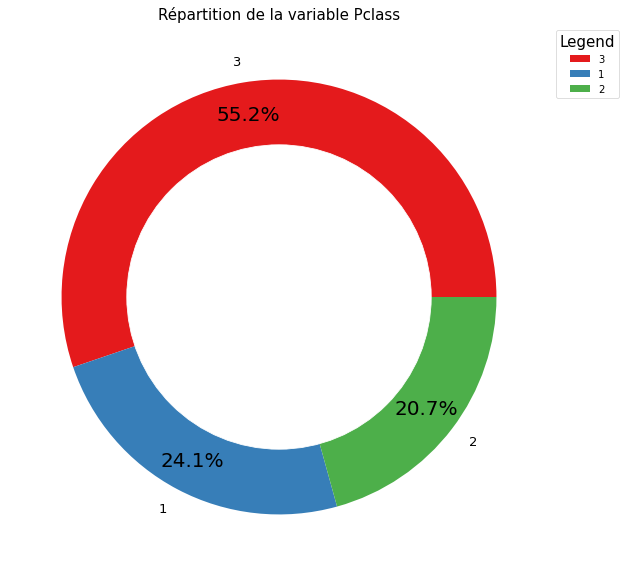

In [157]:
plt.figure(figsize=(30,10))
plt.title("Répartition de la variable Pclass")
plt.pie(valeur2.values(),labels=valeur2.keys(),colors=PALETTE,autopct='%1.1f%%',shadow=False,pctdistance=0.85)
plt.legend(title='Legend',labels=valeur2.keys(),bbox_to_anchor=(1,1))

# add a circle at the center to transform it in a donut chart
circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(circle)


plt.show()

In [158]:
fig = px.bar(df, x='Pclass', color='Survived', template='xgridoff', title='Représentation des survivants en fonction des classes ')
fig

###### Embarked

In [159]:
valeur3=dict(df['Embarked'].value_counts())
valeur3

{'S': 644, 'C': 168, 'Q': 77}

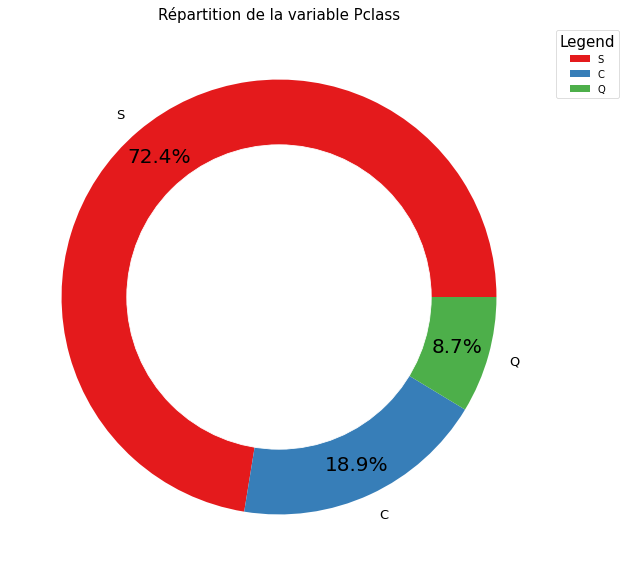

In [160]:
plt.figure(figsize=(30,10))
plt.title("Répartition de la variable Pclass")
plt.pie(valeur3.values(),labels=valeur3.keys(),colors=PALETTE,autopct='%1.1f%%',shadow=False,pctdistance=0.85)
plt.legend(title='Legend',labels=valeur3.keys(),bbox_to_anchor=(1,1))

# add a circle at the center to transform it in a donut chart
circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(circle)


plt.show()

In [161]:
fig = px.bar(df, x='Embarked', template='xgridoff', title='Représentation des survivants en fonction de la variable Embarked', color='Survived')
fig

## ML_BINARY_Classification with Pycaret

Cette partie concerne l'entrainement de plusieurs model de classification binaire que sont les suivant : <br>

Decision Tree Classifier<br>
K Neighbors Classifier<br>
Random Forest Classifier<br>


Cependant nous allons nous interresser au Random Forest Classifier et Ada Boost Classifier.

### Setting up Environment in PyCaret

##### Sepparation de notre jeu de donnée en trainset et testset

In [162]:
data = df.sample(frac=0.90, random_state=786)
data_unseen = df.drop(data.index)
data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)
print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (800, 9)
Unseen Data For Predictions: (89, 9)


In [163]:
from pycaret.classification import *

In [164]:
BinaryClas = setup(data = data, target = 'Survived') 

,Description,Value
0,session_id,7750
1,Target,Survived
2,Target Type,Binary
3,Label Encoded,"No: 0, Yes: 1"
4,Original Data,"(800, 9)"
5,Missing Values,False
6,Numeric Features,4
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


In [165]:
BinaryClas

(False,
       Age  SibSp  Parch     Fare  Pclass_1  Pclass_2  Pclass_3  Sex_male  \
 716  52.0    0.0    0.0  13.0000       0.0       1.0       0.0       1.0   
 669  29.0    0.0    0.0  30.0000       1.0       0.0       0.0       1.0   
 774  28.0    0.0    0.0   8.0500       0.0       0.0       1.0       1.0   
 645  33.0    0.0    0.0  12.2750       0.0       1.0       0.0       1.0   
 661  28.0    1.0    0.0  19.9667       0.0       0.0       1.0       1.0   
 ..    ...    ...    ...      ...       ...       ...       ...       ...   
 433  19.0    0.0    0.0   6.7500       0.0       0.0       1.0       1.0   
 782  22.0    0.0    0.0   7.7750       0.0       0.0       1.0       0.0   
 562  28.0    0.0    0.0   7.8958       0.0       0.0       1.0       1.0   
 310  30.5    0.0    0.0   8.0500       0.0       0.0       1.0       1.0   
 136  50.0    0.0    1.0  26.0000       0.0       1.0       0.0       0.0   
 
      Cabin_A10  Cabin_A19  ...  Cabin_F G73  Cabin_F2  Cabin_F33 

### Comparing All Models

In [46]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.8194,0.8533,0.7493,0.7604,0.7473,0.6075,0.6149,0.0640
gbc,Gradient Boosting Classifier,0.8122,0.8845,0.6898,0.7714,0.7193,0.5806,0.5903,0.0550
lightgbm,Light Gradient Boosting Machine,0.8122,0.8745,0.7195,0.7550,0.7311,0.5877,0.5937,0.2290
lr,Logistic Regression,0.8033,0.8629,0.7045,0.7387,0.7151,0.5663,0.5720,0.6110
ridge,Ridge Classifier,0.8015,0.0000,0.7045,0.7408,0.7156,0.5644,0.5706,0.0160
lda,Linear Discriminant Analysis,0.7997,0.8611,0.7045,0.7382,0.7141,0.5613,0.5677,0.0170
dt,Decision Tree Classifier,0.7890,0.7628,0.6900,0.7220,0.6988,0.5378,0.5442,0.0180
rf,Random Forest Classifier,0.7872,0.8414,0.6802,0.7197,0.6955,0.5329,0.5370,0.1670
et,Extra Trees Classifier,0.7693,0.7993,0.6652,0.6905,0.6747,0.4966,0.4995,0.1510
knn,K Neighbors Classifier,0.7676,0.8108,0.5426,0.7488,0.6211,0.4632,0.4793,0.0230


In [47]:
print(best_model)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=6074)


### Create a Model

##### Decision Tree Classifier

In [52]:
dt = create_model('dt')
display(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8036,0.8415,0.8095,0.7083,0.7556,0.5926,0.5963
1,0.7321,0.6844,0.5238,0.6875,0.5946,0.4000,0.4082
2,0.8571,0.7762,0.6667,0.9333,0.7778,0.6768,0.6976
3,0.7500,0.7139,0.7000,0.6364,0.6667,0.4674,0.4688
4,0.6786,0.6417,0.5000,0.5556,0.5263,0.2841,0.2850
5,0.7321,0.7167,0.6500,0.6190,0.6341,0.4231,0.4234
6,0.8750,0.8937,0.9000,0.7826,0.8372,0.7366,0.7413
7,0.8571,0.8681,0.9000,0.7500,0.8182,0.7021,0.7100
8,0.7500,0.6736,0.5000,0.7143,0.5882,0.4167,0.4303
9,0.8545,0.8179,0.7500,0.8333,0.7895,0.6788,0.6810


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6074, splitter='best')

##### K Neighbors Classifier

In [53]:
knn = create_model('knn')
display(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7857,0.8129,0.7143,0.7143,0.7143,0.5429,0.5429
1,0.6964,0.7313,0.2857,0.7500,0.4138,0.2609,0.3162
2,0.7679,0.8122,0.4762,0.8333,0.6061,0.4583,0.4944
3,0.8036,0.8000,0.6500,0.7647,0.7027,0.5575,0.5616
4,0.7321,0.7639,0.4500,0.6923,0.5455,0.3675,0.3846
5,0.7143,0.7812,0.4500,0.6429,0.5294,0.3333,0.3443
6,0.7321,0.8208,0.5000,0.6667,0.5714,0.3824,0.3907
7,0.8393,0.9014,0.7000,0.8235,0.7568,0.6379,0.6426
8,0.7679,0.8139,0.5500,0.7333,0.6286,0.4647,0.4749
9,0.8364,0.8700,0.6500,0.8667,0.7429,0.6264,0.6404


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

##### Random Forest Classifier

In [54]:
rf = create_model('rf')
display(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7679,0.8537,0.6667,0.7000,0.6829,0.5000,0.5004
1,0.7679,0.7850,0.6190,0.7222,0.6667,0.4902,0.4936
2,0.8393,0.8129,0.6667,0.8750,0.7568,0.6400,0.6532
3,0.7679,0.8042,0.7500,0.6522,0.6977,0.5108,0.5140
4,0.6607,0.6875,0.4500,0.5294,0.4865,0.2356,0.2374
5,0.7143,0.8542,0.6000,0.6000,0.6000,0.3778,0.3778
6,0.9107,0.9722,0.9000,0.8571,0.8780,0.8077,0.8083
7,0.8571,0.9431,0.9000,0.7500,0.8182,0.7021,0.7100
8,0.7500,0.7979,0.5500,0.6875,0.6111,0.4302,0.4360
9,0.8364,0.9036,0.7000,0.8235,0.7568,0.6347,0.6394


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=6074, verbose=0,
                       warm_start=False)

### Tune a Model

In [62]:
# tune dt model
tuned_dt   = tune_model(dt,optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8036,0.8367,0.7143,0.7500,0.7317,0.5769,0.5774
1,0.7143,0.7694,0.4286,0.6923,0.5294,0.3402,0.3604
2,0.6786,0.7544,0.2857,0.6667,0.4000,0.2258,0.2636
3,0.7679,0.7764,0.5500,0.7333,0.6286,0.4647,0.4749
4,0.7500,0.7618,0.4000,0.8000,0.5333,0.3875,0.4309
5,0.7500,0.8382,0.6500,0.6500,0.6500,0.4556,0.4556
6,0.8750,0.9431,0.7500,0.8824,0.8108,0.7184,0.7237
7,0.8393,0.9215,0.7500,0.7895,0.7692,0.6461,0.6466
8,0.7321,0.7236,0.4000,0.7273,0.5161,0.3519,0.3819
9,0.8545,0.9200,0.6500,0.9286,0.7647,0.6641,0.6863


In [63]:
# tune knn model
tuned_knn  = tune_model(knn,optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7143,0.8429,0.2857,0.8571,0.4286,0.2967,0.3764
1,0.7143,0.6762,0.2857,0.8571,0.4286,0.2967,0.3764
2,0.7143,0.8163,0.2381,1.0000,0.3846,0.2809,0.4042
3,0.7143,0.7569,0.2500,0.8333,0.3846,0.2632,0.3443
4,0.7143,0.7069,0.2500,0.8333,0.3846,0.2632,0.3443
5,0.7500,0.8611,0.3500,0.8750,0.5000,0.3718,0.4412
6,0.7143,0.8111,0.3000,0.7500,0.4286,0.2821,0.3347
7,0.8036,0.9465,0.5000,0.9091,0.6452,0.5247,0.5695
8,0.6786,0.7403,0.2500,0.6250,0.3571,0.1923,0.2282
9,0.6909,0.8186,0.3000,0.6667,0.4138,0.2429,0.2786


In [64]:
# tune rf model
tuned_rf   = tune_model(rf,optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8393,0.8932,0.9048,0.7308,0.8085,0.6727,0.6841
1,0.7143,0.8211,0.7143,0.6000,0.6522,0.4128,0.4174
2,0.8750,0.8415,0.7619,0.8889,0.8205,0.7255,0.7306
3,0.8214,0.8458,0.8000,0.7273,0.7619,0.6196,0.6214
4,0.7857,0.8090,0.6500,0.7222,0.6842,0.5227,0.5244
5,0.7143,0.8847,0.7000,0.5833,0.6364,0.4043,0.4088
6,0.8571,0.9639,0.9500,0.7308,0.8261,0.7083,0.7259
7,0.8929,0.9653,1.0000,0.7692,0.8696,0.7812,0.8006
8,0.7679,0.8153,0.7000,0.6667,0.6829,0.5000,0.5004
9,0.8727,0.9286,0.9000,0.7826,0.8372,0.7336,0.7384


In [68]:
display(tuned_dt,tuned_knn,tuned_rf)

AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.5,
                   n_estimators=50, random_state=6074)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=11, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=9,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6074, splitter='best')

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=26, p=2,
                     weights='uniform')

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=9, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.002, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=260,
                       n_jobs=-1, oob_score=False, random_state=6074, verbose=0,
                       warm_start=False)

### Plot a Model only for Random Forest Classifier

#### AUC Plot

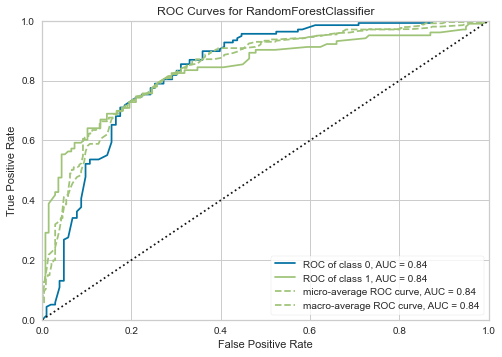

In [69]:
plot_model(tuned_rf, plot = 'auc')

#### Precision-Recall Curve

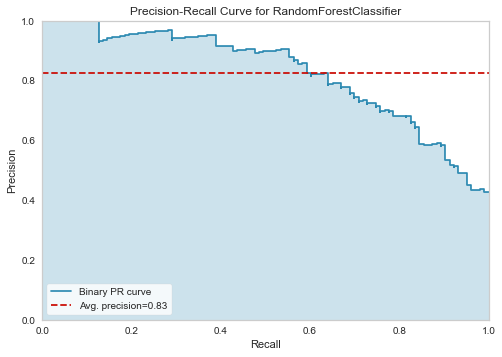

In [70]:
plot_model(tuned_rf, plot = 'pr')

#### Feature Importance Plot

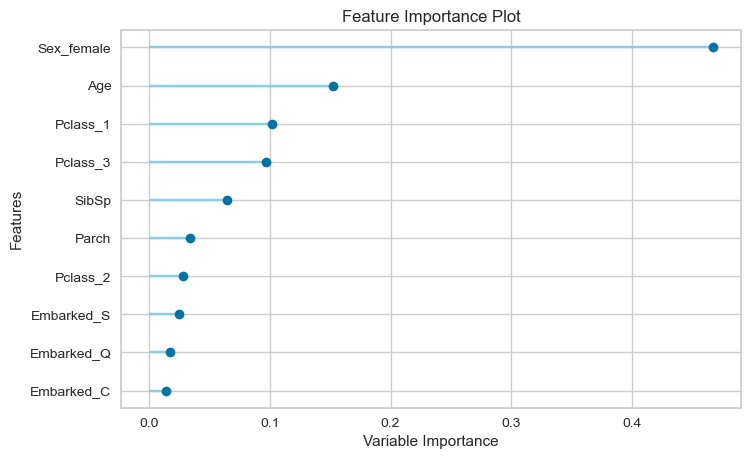

In [71]:
plot_model(tuned_rf, plot='feature')

#### Confusion Matrix

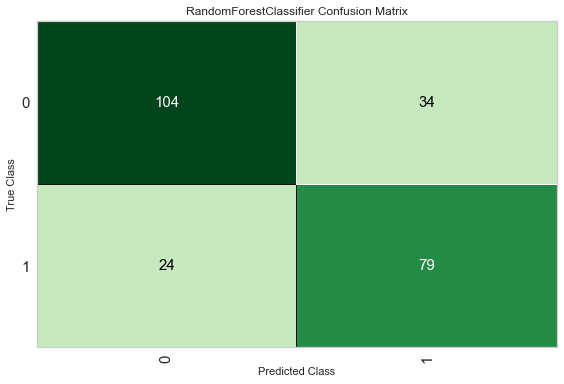

In [72]:
plot_model(tuned_rf, plot = 'confusion_matrix')

#### Evaluate model

In [73]:
evaluate_model(tuned_rf) 

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#### Predict model 

In [76]:
predict_model(tuned_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7593,0.8357,0.7670,0.6991,0.7315,0.5143,0.5161


,Age,SibSp,Parch,Pclass_1,Pclass_2,Pclass_3,Sex_female,Embarked_C,Embarked_Q,Embarked_S,Survived,Label,Score
0,28.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,Yes,Yes,0.8534
1,40.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,No,No,0.8479
2,51.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,No,Yes,0.5147
3,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,No,No,0.8238
4,5.0,4.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,Yes,No,0.7695
...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,27.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Yes,Yes,0.5583
237,35.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,No,No,0.8432
238,9.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,Yes,Yes,0.5696
239,48.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,Yes,Yes,0.6559


#### finalize model for deployement

In [77]:
final_rf = finalize_model(tuned_rf)

In [78]:
predict_model(final_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7759,0.8764,0.7864,0.7168,0.7500,0.5478,0.5497


,Age,SibSp,Parch,Pclass_1,Pclass_2,Pclass_3,Sex_female,Embarked_C,Embarked_Q,Embarked_S,Survived,Label,Score
0,28.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,Yes,Yes,0.8450
1,40.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,No,No,0.8350
2,51.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,No,Yes,0.5486
3,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,No,No,0.7948
4,5.0,4.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,Yes,No,0.6114
...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,27.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Yes,Yes,0.5456
237,35.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,No,No,0.8101
238,9.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,Yes,Yes,0.5419
239,48.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,Yes,Yes,0.5749


#### Prediction on unseen data

In [79]:
unseen_predictions = predict_model(final_rf, data=data_unseen)
unseen_predictions.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Embarked,Label,Score
0,Yes,1,female,35.0,1.0,0.0,S,Yes,0.9165
1,No,3,male,28.0,0.0,0.0,Q,No,0.7746
2,Yes,2,male,28.0,0.0,0.0,S,No,0.8174
3,No,3,male,28.0,1.0,0.0,Q,No,0.7583
4,No,3,male,28.0,2.0,0.0,C,No,0.6723


#### Save a model

In [81]:
save_model(final_rf,'Titanic_BinaryClas')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='Survived',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_str...
                  RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                                         class_weight='balanced',
                                         criterion='entropy', max_depth=9,
                                         max_features='sqrt'

#### load a model and prediction on data test

###### Loading and cleanning data test 

In [93]:
import pandas as pd
df = pd.read_csv(r'C:\Users\JeanPhilippeNdri\Desktop\Titanic\test.csv', sep=',', decimal='.')
df['Pclass'] = df['Pclass'].astype('object')
dfT = df.drop(columns=['PassengerId', 'Name', 'Cabin', 'Fare', 'Ticket'])
dfT['SibSp'] = dfT['SibSp'].astype('float')
dfT['Parch'] = dfT['Parch'].astype('float')

In [94]:
dfT

,Pclass,Sex,Age,SibSp,Parch,Embarked
0,3,male,34.5,0.0,0.0,Q
1,3,female,47.0,1.0,0.0,S
2,2,male,62.0,0.0,0.0,Q
3,3,male,27.0,0.0,0.0,S
4,3,female,22.0,1.0,1.0,S
...,...,...,...,...,...,...
413,3,male,NaN,0.0,0.0,S
414,1,female,39.0,0.0,0.0,C
415,3,male,38.5,0.0,0.0,S
416,3,male,NaN,0.0,0.0,S


In [83]:
saved_final_rf = load_model('Titanic_BinaryClas')

Transformation Pipeline and Model Successfully Loaded


In [95]:
new_prediction = predict_model(saved_final_rf, data=dfT)

In [96]:
new_prediction.head()

,Pclass,Sex,Age,SibSp,Parch,Embarked,Label,Score
0,3,male,34.5,0.0,0.0,Q,No,0.8418
1,3,female,47.0,1.0,0.0,S,No,0.5547
2,2,male,62.0,0.0,0.0,Q,No,0.7882
3,3,male,27.0,0.0,0.0,S,No,0.7925
4,3,female,22.0,1.0,1.0,S,Yes,0.5802
